# New York City Airbnb Case Study

#### Airbnb listings and metrics in NYC, NY, USA (2019)

# Context:
#### This dataset describes the listing activity and metrics in NYC, NY for 2019.

- By Chitranshee Agrawal

## Importing libraries

#### Here we are importing all the libraries required for the case study.



In [1]:
import numpy as np  #linear regression
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import geopandas as gpd
from shapely.geometry import Point, Polygon
import descartes

In [2]:
from wordcloud import WordCloud
from sklearn.preprocessing import OneHotEncoder
import plotly.express as px
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.metrics import confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn import tree
from sklearn.metrics import classification_report
from sklearn.metrics import auc
from sklearn.metrics import plot_roc_curve
from sklearn.model_selection import StratifiedKFold
import array
import warnings
from pylab import rcParams
from scipy.stats import f_oneway
from scipy.stats import ttest_ind
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn import metrics
from sklearn.pipeline import Pipeline

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:7: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import (to_datetime, Int64Index, DatetimeIndex, Period,
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:7: FutureWarning: pandas.Float64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import (to_datetime, Int64Index, DatetimeIndex, Period,


## Read the data set for airbnb

In [3]:
df = pd.read_csv("AB_NYC_2019.csv")

## Understanding the dataset

In [4]:
df_copy = df.copy()
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,19-10-2018,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,21-05-2019,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,05-07-2019,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,19-11-2018,0.10,1,0


We can see that there are some NaN values in the last_review and reviews_per_month columns. We will look into the null values in details later.

In [5]:
df.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,4.889500e+04,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,1.901714e+07,6.762001e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,1.098311e+07,7.861097e+07,0.054530,0.046157,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,2.539000e+03,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,9.471945e+06,7.822033e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,1.967728e+07,3.079382e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,2.915218e+07,1.074344e+08,40.763115,-73.936275,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


In [6]:
df.shape

(48895, 16)

We can see that the price column has some irregularity as the minimum price of the apartment is 0 i.e Free stay?. We will have look deeper into this later.

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [8]:
# Insight about unique values 

df.nunique()

id                                48895
name                              47896
host_id                           37457
host_name                         11452
neighbourhood_group                   5
neighbourhood                       221
latitude                          19048
longitude                         14718
room_type                             3
price                               674
minimum_nights                      109
number_of_reviews                   394
last_review                        1764
reviews_per_month                   937
calculated_host_listings_count       47
availability_365                    366
dtype: int64

In [9]:
#Task 4 What are the room_type available
df.room_type.unique()

array(['Private room', 'Entire home/apt', 'Shared room'], dtype=object)

### There are 3 types of room available "Shared room", "Entire Home or Apartment" and "priavte room"

In [10]:
df.loc[df.room_type == 'Shared room']

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
39,12048,LowerEastSide apt share shortterm 1,7549,Ben,Manhattan,Lower East Side,40.71401,-73.98917,Shared room,40,1,214,05-07-2019,1.81,4,188
203,54453,MIDTOWN WEST - Large alcove studio,255583,Anka,Manhattan,Hell's Kitchen,40.76548,-73.98474,Shared room,105,6,10,07-01-2014,0.09,1,363
357,99070,Comfortable Cozy Space in El Barrio,522065,Liz And Melissa,Manhattan,East Harlem,40.79406,-73.94102,Shared room,65,7,131,26-05-2019,1.31,2,0
492,173072,Cozy Pre-War Harlem Apartment,826192,Lewis,Manhattan,Harlem,40.80827,-73.95329,Shared room,49,3,168,06-07-2019,4.60,1,248
545,200645,Best Manhattan Studio Deal!,933378,Edo,Manhattan,Upper East Side,40.76739,-73.95570,Shared room,90,1,0,NaN,NaN,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48832,36450814,FLATBUSH HANG OUT AND GO,267223765,Jarmel,Brooklyn,Flatbush,40.64922,-73.96078,Shared room,20,1,0,NaN,NaN,3,363
48855,36456829,Perfectly Located Organic Getaway,6677425,Isabel,Manhattan,Upper West Side,40.79753,-73.96155,Shared room,55,2,0,NaN,NaN,2,49
48867,36473044,The place you were dreaming for.(only for guys),261338177,Diana,Brooklyn,Gravesend,40.59080,-73.97116,Shared room,25,1,0,NaN,NaN,6,338
48868,36473253,Heaven for you(only for guy),261338177,Diana,Brooklyn,Gravesend,40.59118,-73.97119,Shared room,25,7,0,NaN,NaN,6,365


In [11]:
df.loc[df.room_type == 'Shared room']

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
39,12048,LowerEastSide apt share shortterm 1,7549,Ben,Manhattan,Lower East Side,40.71401,-73.98917,Shared room,40,1,214,05-07-2019,1.81,4,188
203,54453,MIDTOWN WEST - Large alcove studio,255583,Anka,Manhattan,Hell's Kitchen,40.76548,-73.98474,Shared room,105,6,10,07-01-2014,0.09,1,363
357,99070,Comfortable Cozy Space in El Barrio,522065,Liz And Melissa,Manhattan,East Harlem,40.79406,-73.94102,Shared room,65,7,131,26-05-2019,1.31,2,0
492,173072,Cozy Pre-War Harlem Apartment,826192,Lewis,Manhattan,Harlem,40.80827,-73.95329,Shared room,49,3,168,06-07-2019,4.60,1,248
545,200645,Best Manhattan Studio Deal!,933378,Edo,Manhattan,Upper East Side,40.76739,-73.95570,Shared room,90,1,0,NaN,NaN,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48832,36450814,FLATBUSH HANG OUT AND GO,267223765,Jarmel,Brooklyn,Flatbush,40.64922,-73.96078,Shared room,20,1,0,NaN,NaN,3,363
48855,36456829,Perfectly Located Organic Getaway,6677425,Isabel,Manhattan,Upper West Side,40.79753,-73.96155,Shared room,55,2,0,NaN,NaN,2,49
48867,36473044,The place you were dreaming for.(only for guys),261338177,Diana,Brooklyn,Gravesend,40.59080,-73.97116,Shared room,25,1,0,NaN,NaN,6,338
48868,36473253,Heaven for you(only for guy),261338177,Diana,Brooklyn,Gravesend,40.59118,-73.97119,Shared room,25,7,0,NaN,NaN,6,365


## 5 location and 3 roomtype

In [12]:
df.duplicated().sum()

0

## Data Analysis and Visualization

### HOST ID

In [13]:
df.host_id.value_counts().iloc[:5]

219517861    327
107434423    232
30283594     121
137358866    103
16098958      96
Name: host_id, dtype: int64

<AxesSubplot:>

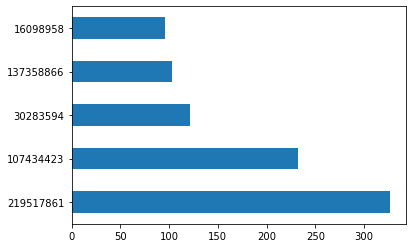

In [14]:
df.host_id.value_counts().iloc[:5].plot(kind = 'barh')

## Room Type

In [15]:
df.room_type.value_counts()

Entire home/apt    25409
Private room       22326
Shared room         1160
Name: room_type, dtype: int64

<AxesSubplot:ylabel='room_type'>

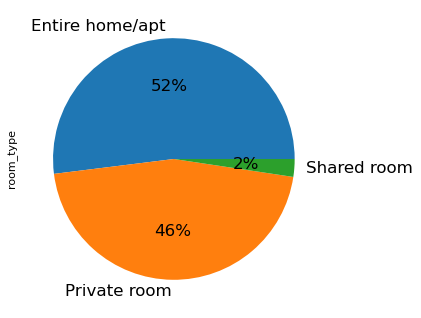

In [16]:
fig = plt.figure(figsize=(5,5), dpi=80)
df['room_type'].value_counts().plot(kind='pie',  autopct='%1.0f%%', startangle=360, fontsize=15)

around 25k people (52%) choose to use a house while 22k(46%) for a private room. Only 1k(2%) people choose a shared room. This could mean more people who use airbnb , use it with family maybe for tours,visits,etc...

## Neighbourhood Groups - Location

In [17]:
# There are 5 particular neighbourhood_group, which means 5 unique locations.
df['neighbourhood_group'].value_counts()

Manhattan        21661
Brooklyn         20104
Queens            5666
Bronx             1091
Staten Island      373
Name: neighbourhood_group, dtype: int64

<AxesSubplot:ylabel='neighbourhood_group'>

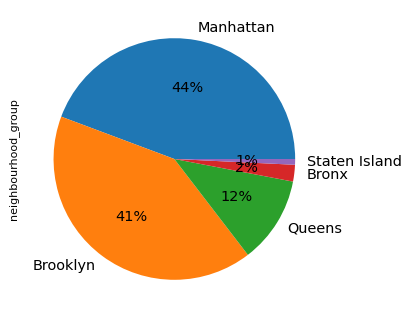

In [18]:
fig = plt.figure(figsize=(5,5), dpi=80)
df['neighbourhood_group'].value_counts().plot(kind='pie',  autopct='%1.0f%%', startangle=360, fontsize=13)

Manhattan is the city where most Airbnb transactions have occured with 44% of entire dataset. The least happend in Staten Island only 1%. Brooklyn consisted on 41% of transactions with 12% Queens and 2 % in Bronx.

## Neighbourhoods:

In [19]:
df['neighbourhood'].value_counts().iloc[:5]

Williamsburg          3920
Bedford-Stuyvesant    3714
Harlem                2658
Bushwick              2465
Upper West Side       1971
Name: neighbourhood, dtype: int64

In [20]:
df['neighbourhood'].unique()

array(['Kensington', 'Midtown', 'Harlem', 'Clinton Hill', 'East Harlem',
       'Murray Hill', 'Bedford-Stuyvesant', "Hell's Kitchen",
       'Upper West Side', 'Chinatown', 'South Slope', 'West Village',
       'Williamsburg', 'Fort Greene', 'Chelsea', 'Crown Heights',
       'Park Slope', 'Windsor Terrace', 'Inwood', 'East Village',
       'Greenpoint', 'Bushwick', 'Flatbush', 'Lower East Side',
       'Prospect-Lefferts Gardens', 'Long Island City', 'Kips Bay',
       'SoHo', 'Upper East Side', 'Prospect Heights',
       'Washington Heights', 'Woodside', 'Brooklyn Heights',
       'Carroll Gardens', 'Gowanus', 'Flatlands', 'Cobble Hill',
       'Flushing', 'Boerum Hill', 'Sunnyside', 'DUMBO', 'St. George',
       'Highbridge', 'Financial District', 'Ridgewood',
       'Morningside Heights', 'Jamaica', 'Middle Village', 'NoHo',
       'Ditmars Steinway', 'Flatiron District', 'Roosevelt Island',
       'Greenwich Village', 'Little Italy', 'East Flatbush',
       'Tompkinsville', 'Asto

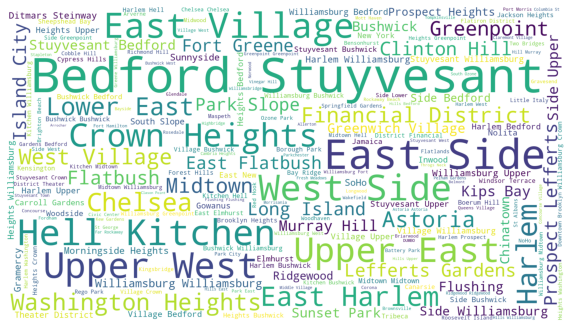

In [21]:
plt.subplots(figsize=(10,10))
wordcloud = WordCloud(background_color='white', width=1920,height=1080).generate(" ".join(df.neighbourhood))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

<AxesSubplot:ylabel='neighbourhood'>

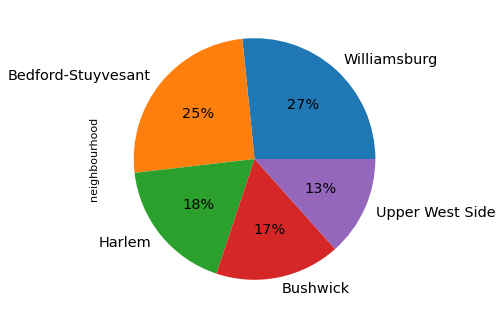

In [22]:
fig = plt.figure(figsize=(5,5), dpi=80)
df['neighbourhood'].value_counts().iloc[:5].plot(kind='pie',  autopct='%1.0f%%', startangle=360, fontsize=13)

We can see that Williamsburg is the hottest area of transaction followed by Bedford-Stuyvesant.

This pie-chart shows the top 5 areas by percentage in the dataset.

## Price:

In [23]:
df.price.value_counts().iloc[:10]

100    2051
150    2047
50     1534
60     1458
200    1401
75     1370
80     1272
65     1190
70     1170
120    1130
Name: price, dtype: int64

<AxesSubplot:>

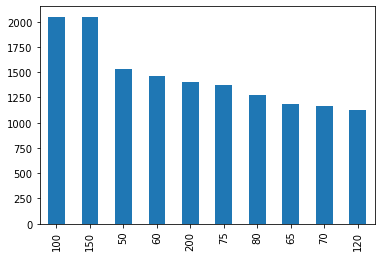

In [24]:
df.price.value_counts().iloc[:10].plot(kind = 'bar')

### Almost 2k+ airbnb's has a price of 100 dollars and 150 dollars each respectively.

1.5k airbnb's have around 50 dollars price.

In [25]:
df.price.describe()

count    48895.000000
mean       152.720687
std        240.154170
min          0.000000
25%         69.000000
50%        106.000000
75%        175.000000
max      10000.000000
Name: price, dtype: float64

The average pricing is around 152 dollars.

50% of data has price greater than 106 dollars.

The costliest airbnb has around 10k dollars as price

In [26]:
df[df['price'] == 10000.000000]

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
9151,7003697,Furnished room in Astoria apartment,20582832,Kathrine,Queens,Astoria,40.76810,-73.91651,Private room,10000,100,2,13-02-2016,0.04,1,0
17692,13894339,Luxury 1 bedroom apt. -stunning Manhattan views,5143901,Erin,Brooklyn,Greenpoint,40.73260,-73.95739,Entire home/apt,10000,5,5,27-07-2017,0.16,1,0
29238,22436899,1-BR Lincoln Center,72390391,Jelena,Manhattan,Upper West Side,40.77213,-73.98665,Entire home/apt,10000,30,0,NaN,NaN,1,83


## We have 3 airbnbs with 10k per night luxury stay, one private room and 2 home stay.

# Minimum Nights

In [27]:
df['minimum_nights'].value_counts()

1      12720
2      11696
3       7999
30      3760
4       3303
       ...  
186        1
366        1
68         1
87         1
36         1
Name: minimum_nights, Length: 109, dtype: int64

In [28]:
for i in range(1,11):
    print("Number of nights: ",i)
    print("Amount of trasactions:",len(df[df['minimum_nights'] == i]))

Number of nights:  1
Amount of trasactions: 12720
Number of nights:  2
Amount of trasactions: 11696
Number of nights:  3
Amount of trasactions: 7999
Number of nights:  4
Amount of trasactions: 3303
Number of nights:  5
Amount of trasactions: 3034
Number of nights:  6
Amount of trasactions: 752
Number of nights:  7
Amount of trasactions: 2058
Number of nights:  8
Amount of trasactions: 130
Number of nights:  9
Amount of trasactions: 80
Number of nights:  10
Amount of trasactions: 483


<AxesSubplot:>

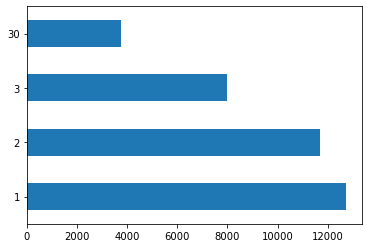

In [29]:
df['minimum_nights'].value_counts().iloc[:4].plot(kind = 'barh')

We can observe that most of almost 12k people used 1 night stay in airbnb.

11k people choose 2 night stay while 7k choose 3 night stay.

Almost 3.7k stayed upto a month.

## Number of reviews

In [30]:
df['number_of_reviews'].value_counts()

0      10052
1       5244
2       3465
3       2520
4       1994
       ...  
313        1
540        1
480        1
326        1
341        1
Name: number_of_reviews, Length: 394, dtype: int64

### 10k airbnbs dont have any reviews.

5.2k has around 1 review and the maximum number of reviews is 607 which only 1 airbnb has.

In [31]:
df[df['number_of_reviews'] == 607]

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
2031,903972,Great Bedroom in Manhattan,4734398,Jj,Manhattan,Harlem,40.82085,-73.94025,Private room,49,1,607,21-06-2019,7.75,3,293


## Great Bedroom in Manhattan gets the highest reviews and it costs around 69 dollars.

## Availablity

In [32]:
df['availability_365'].value_counts()

0      17533
365     1295
364      491
1        408
89       361
       ...  
195       26
183       24
196       24
181       23
202       20
Name: availability_365, Length: 366, dtype: int64

### Around 1.3k airbnbs have 365 days availablity and rest doesnt.

In [33]:
df[df['availability_365'] == 365].describe()


,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,1.295000e+03,1.295000e+03,1295.000000,1295.000000,1295.000000,1295.00000,1295.000000,841.000000,1295.000000,1295.0
mean,1.940195e+07,8.554698e+07,40.729014,-73.943275,250.769884,19.60000,10.220849,0.832545,13.158301,365.0
std,1.197265e+07,8.786960e+07,0.057781,0.059799,550.497373,65.05093,22.095983,1.112493,36.224171,0.0
min,2.539000e+03,2.787000e+03,40.507080,-74.242850,20.000000,1.00000,0.000000,0.010000,1.000000,365.0
25%,8.725256e+06,8.931349e+06,40.687990,-73.983210,72.000000,1.00000,0.000000,0.130000,1.000000,365.0
50%,2.065068e+07,4.634351e+07,40.730990,-73.954270,125.000000,3.00000,2.000000,0.410000,2.000000,365.0
75%,3.027040e+07,1.565055e+08,40.762095,-73.921715,225.000000,30.00000,10.000000,1.000000,7.000000,365.0
max,3.648315e+07,2.733930e+08,40.893740,-73.721730,9999.000000,1250.00000,183.000000,8.940000,327.000000,365.0


### Costliest airbnb with 365 days availablity costs around 10k dollars with average of 250 dollars.

## Reviews per month

In [34]:
df_copy[df_copy['reviews_per_month'] > 1].reviews_per_month.value_counts().sum() 

# 15.9k reviews were above 1.

15908

In [35]:
df[df['reviews_per_month'] > 1]['reviews_per_month'].value_counts().iloc[:5]   

# Above 1, around 406 airbnbs have 2 reviews per month, 222 with 3 and 130 with 4.

2.00    406
3.00    222
4.00    130
1.15     90
1.05     88
Name: reviews_per_month, dtype: int64

In [36]:
df['reviews_per_month'].max()

58.5

In [37]:
df_copy[df['reviews_per_month'] == 58.5]

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
42075,32678719,Enjoy great views of the City in our Deluxe Room!,244361589,Row NYC,Manhattan,Theater District,40.75918,-73.98801,Private room,100,1,156,07-07-2019,58.5,9,299


#### Enjoy great views in Manhattan has the highest reviews per month. They offer Private room and is worth 100 dollars a night.

## Calculate host listing

In [38]:
df.calculated_host_listings_count.value_counts().iloc[:5]

1    32303
2     6658
3     2853
4     1440
5      845
Name: calculated_host_listings_count, dtype: int64

<AxesSubplot:>

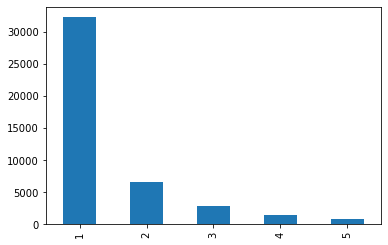

In [39]:
df.calculated_host_listings_count.value_counts().iloc[:5].plot(kind = 'bar')

Most hosts used the listings only once that is around 32.3k and 6.6k around 2 times.

In [40]:
df.calculated_host_listings_count.describe()

count    48895.000000
mean         7.143982
std         32.952519
min          1.000000
25%          1.000000
50%          1.000000
75%          2.000000
max        327.000000
Name: calculated_host_listings_count, dtype: float64

On an average, a host has used listings 7 times.

Maximum times being 327.

In [41]:
df.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

Missing values are present in the name, host_name, last_reviews and reviews_per_month columns. In the above exploration part we can see that if the number_of_reviews is 0 then it does not make sense to have last_review and reviews_per_month and are marked as NaN. Hence the missing values in the data is following a pattern and will be treated accordingly.

Let us check if the assumption made above holds true.

In [42]:
df.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365'],
      dtype='object')

In [43]:
#checking the assumption -> 0 reviews will have missing values in last_review and reviews_per_month columns.
assumption_test = df.loc[(df.last_review.isnull()) & (df.reviews_per_month.isnull()), ['number_of_reviews',  'last_review', 'reviews_per_month']]
assumption_test.head()

,number_of_reviews,last_review,reviews_per_month
2,0,NaN,NaN
19,0,NaN,NaN
26,0,NaN,NaN
36,0,NaN,NaN
38,0,NaN,NaN


In [44]:
assumption_test.shape

(10052, 3)

In [45]:
#filling the missing values in reviews_per_month with 0.
df.reviews_per_month.fillna(0, inplace=True)

In [46]:
#Checking if the changes made are reflected.
df.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                     0
calculated_host_listings_count        0
availability_365                      0
dtype: int64

## Exploratory Data Analysis

Williamsburg          3920
Bedford-Stuyvesant    3714
Harlem                2658
Bushwick              2465
Upper West Side       1971
Name: neighbourhood, dtype: int64


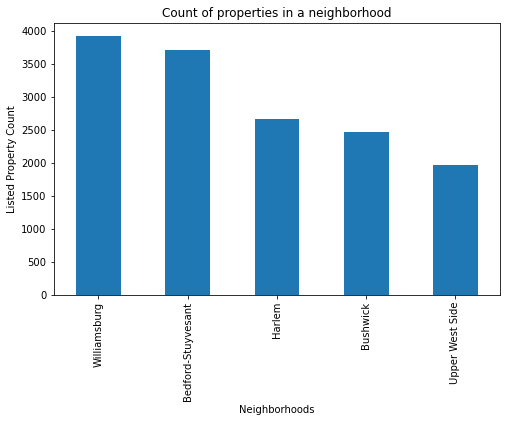

In [47]:
#checking the to 5 neighborhood where the properties are listed most.
top_5_neighborhoods = df.neighbourhood.value_counts().head(5)
print(top_5_neighborhoods)

#plotting 
plt.figure(figsize=(8,5))
top_5_neighborhoods.plot.bar()
plt.xlabel('Neighborhoods')
plt.ylabel('Listed Property Count')
plt.title('Count of properties in a neighborhood')
plt.show() #optional

The top 5 neighborhoods whcih have the highest number of properties listed are shown above.
We can see that Williamsburg has the highest number of properties listed (3920) followed by Bedford-Stuyvesant (3714).

As Williamsburg has the highest number of properties listed then the Brooklyn neighborhood group must also have the highest number of properties listed as williamburg comes under brooklyn neighborhood group.

Lets check if this is correct or not.

Manhattan        21661
Brooklyn         20104
Queens            5666
Bronx             1091
Staten Island      373
Name: neighbourhood_group, dtype: int64


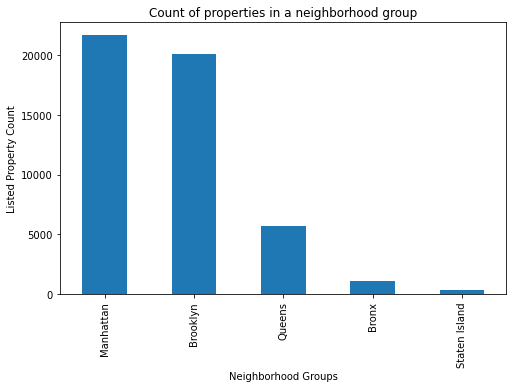

In [48]:
#checking the to 5 neighborhood groups where the properties are listed most.
top_5_neighborhood_group = df.neighbourhood_group.value_counts()
print(top_5_neighborhood_group)

#plotting 
plt.figure(figsize=(8,5))
top_5_neighborhood_group.plot.bar()
plt.xlabel('Neighborhood Groups')
plt.ylabel('Listed Property Count')
plt.title('Count of properties in a neighborhood group')
plt.show() #optional

Our assumption was wrong. As it turned out that Manhattan has the higghest number of properties listed although Williamsburg town in Brooklyn had the highest number of properties amongh the neighbor towns.

This infers that there are many other towns in Manhattan that have properties listed and that is why Manhattan neighborhood as a whole has the highest number of properties.

We can also see that other neighborhood groups such as Queens, Bronx and Staten Island contribute less compared to Manhattan and Brooklyn.

Entire home/apt    25409
Private room       22326
Shared room         1160
Name: room_type, dtype: int64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='room_type', ylabel='count'>

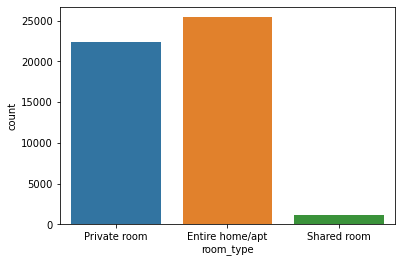

In [49]:
#number of rooms_type provided by the hosts
print(df.room_type.value_counts())
sns.countplot(df.room_type)

There are 3 room type provided by the host. Most of the rooms provided are private rooms and Entire home or apartments type.

Share rooms are listed very few, as it make sense that people travelling with family will prefer the top 2 room types rather than sharing.

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='price', ylabel='Density'>

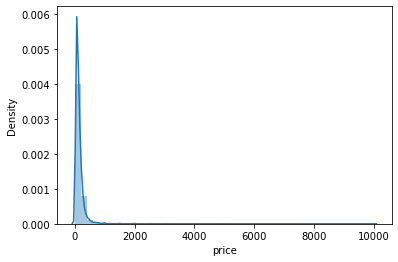

In [50]:
#Lets check the distribution of the price of the properties.
sns.distplot(df.price, bins=50)

The distribution of price is heavily left skewed. Meaning the most of the properties price are between 0 - 2000 and some minority of the properties are having prices greatr than that making the data to be skewed.

Also we saw that some properties have a price as 0 and that could not be possible here as no one will be giving their property on rent for free! That will be absurd.

In [51]:
#Looking into the properties having 0 Price
free_properties = df.loc[df.price <= 0]
print('Shape of the data:', free_properties.shape)
free_properties.head()

Shape of the data: (11, 16)


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
23161,18750597,"Huge Brooklyn Brownstone Living, Close to it all.",8993084,Kimberly,Brooklyn,Bedford-Stuyvesant,40.69023,-73.95428,Private room,0,4,1,06-01-2018,0.05,4,28
25433,20333471,★Hostel Style Room | Ideal Traveling Buddies★,131697576,Anisha,Bronx,East Morrisania,40.83296,-73.88668,Private room,0,2,55,24-06-2019,2.56,4,127
25634,20523843,"MARTIAL LOFT 3: REDEMPTION (upstairs, 2nd room)",15787004,Martial Loft,Brooklyn,Bushwick,40.69467,-73.92433,Private room,0,2,16,18-05-2019,0.71,5,0
25753,20608117,"Sunny, Quiet Room in Greenpoint",1641537,Lauren,Brooklyn,Greenpoint,40.72462,-73.94072,Private room,0,2,12,27-10-2017,0.53,2,0
25778,20624541,Modern apartment in the heart of Williamsburg,10132166,Aymeric,Brooklyn,Williamsburg,40.70838,-73.94645,Entire home/apt,0,5,3,02-01-2018,0.15,1,73


11 properties are having 0 price. Assuming this to be a mistake or error from the Airbnb side, we will have to impute the prices according.

One way to impute will be by taking the mean, but as we saw earlier the price distribution is highly skewed and hence that will affect the mean of the price.

Presence of outliers or extreme values in the dataset effect the mean of the data and is not a good option to impute. Other method is to impute the data with mediian as median is less affected by outliers/extreme values.

The other effective way will be to see the affect of price or the relation of price on various other factors in the dataset and come up with a formula or a model that will do the imputation for us.
We will look into this later.

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='minimum_nights', ylabel='Density'>

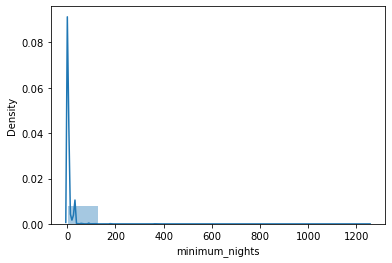

In [52]:
#minimum number of nights allowed by the host.
sns.distplot(df.minimum_nights, bins=10)

The minimum nights goes from 1 to 1200+. Only 1 host provide minimum_nights to be 1200+. We come to know from the distribution that the data is skewed.

Now let's check which top 5 properties have recieved the highest number of reviewes.

In [53]:
#properties recieving highest reviews.
highest_reviews = df.sort_values(by='number_of_reviews', ascending=False)
highest_reviews.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
11759,9145202,Room near JFK Queen Bed,47621202,Dona,Queens,Jamaica,40.66730,-73.76831,Private room,47,1,629,05-07-2019,14.58,2,333
2031,903972,Great Bedroom in Manhattan,4734398,Jj,Manhattan,Harlem,40.82085,-73.94025,Private room,49,1,607,21-06-2019,7.75,3,293
2030,903947,Beautiful Bedroom in Manhattan,4734398,Jj,Manhattan,Harlem,40.82124,-73.93838,Private room,49,1,597,23-06-2019,7.72,3,342
2015,891117,Private Bedroom in Manhattan,4734398,Jj,Manhattan,Harlem,40.82264,-73.94041,Private room,49,1,594,15-06-2019,7.57,3,339
13495,10101135,Room Near JFK Twin Beds,47621202,Dona,Queens,Jamaica,40.66939,-73.76975,Private room,47,1,576,27-06-2019,13.40,2,173


The above table shows the top 5 properties which have recieved the highest number of reviews. Out of the 5, three properties are from the Manhattan neighborhood group in Harlem.

The top property which has recieved the most reviews is from Queens in the neighborhood of Jamica. The property having 5th highest review is also from Queens.

Let us look at these properties and try to come up with some hypothesis on why these properties have the highest reviews.

These properties are the most popular properties among the others and that is why they may be getting more bookings and hence more reviews.
They come from the same host i.e Dona and JJ. May be they are a good and popular hosts that is why are recieving good amount of bookings and reviews.
The Dona host has her room near the JFK i.e nearer to the international airport and that's why the high amount of bookings.
All of them share the similar room type, i.e Private rooms. So we can assume that the private rooms are more popular than any other rooms.
The price is also almost similar of all the properties approx 50.
They all offer minimum 1 night stay which most of the people prefer as it is very flexible.
The availability of the rooms is also high with the top 4 having an availability rate of approx 300 days and +.

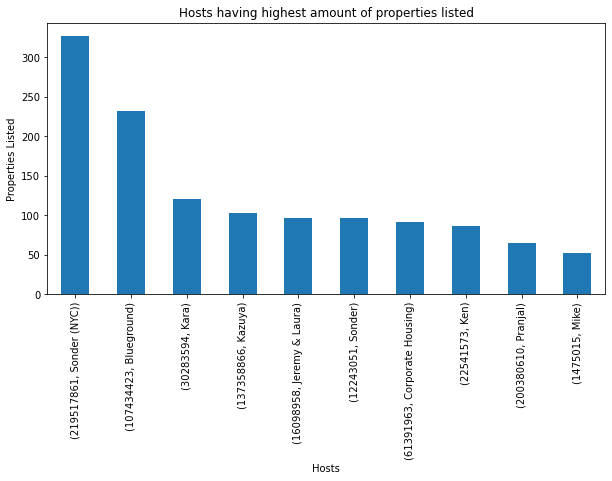

In [54]:
#host having highest amount of properties listed.
highest_props_host = df.groupby(['host_id', 'host_name'])['host_id'].count().sort_values(ascending=False)[:10]
highest_props_host.plot.bar(figsize=(10,5))
plt.xlabel('Hosts')
plt.ylabel('Properties Listed')
plt.title('Hosts having highest amount of properties listed');

We can see that Sonder(NYC) has the highest number of properties that are listed but his property was not in the top 5 highest reviews table we saw earlier.

This means that the number of properties listed on the Airbnb does not mean that the number of customers you will have will be more.

## Bivariate Analysis

<AxesSubplot:>

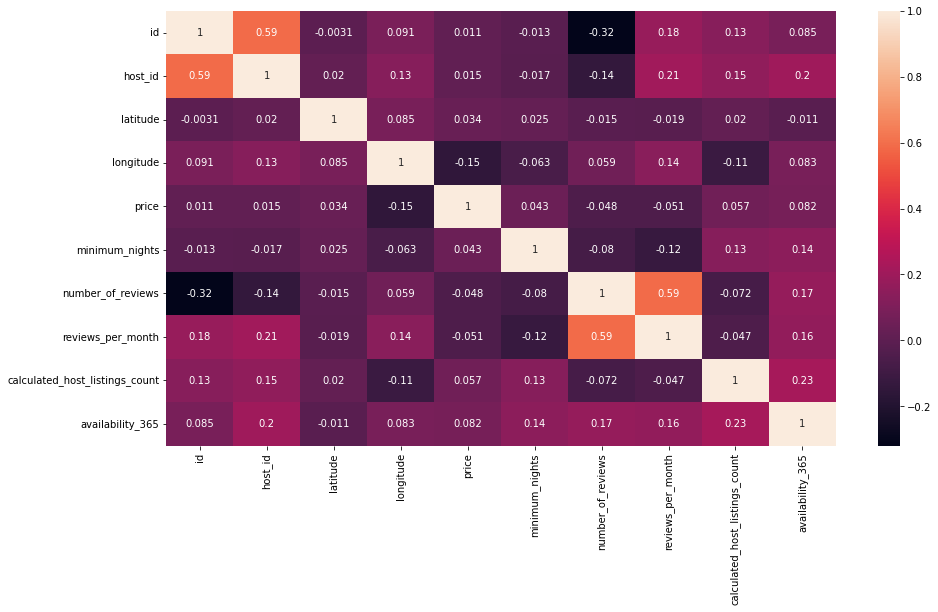

In [55]:
corr = df.corr()
plt.figure(figsize=(15,8))
sns.heatmap(corr, annot=True)

## Maps - Scatterplots
### Latitude and Longitude with loaction

In [56]:
df['neighbourhood_group'].value_counts()

Manhattan        21661
Brooklyn         20104
Queens            5666
Bronx             1091
Staten Island      373
Name: neighbourhood_group, dtype: int64

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='longitude', ylabel='latitude'>

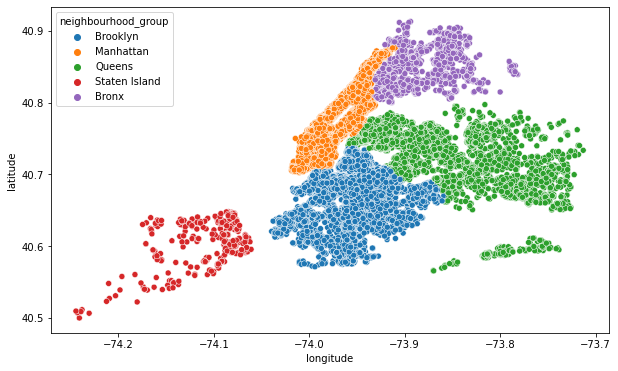

In [57]:
plt.figure(figsize=(10,6))
sns.scatterplot(df.longitude,df.latitude,hue=df.neighbourhood_group)

### This shows us the dataset distribution in NewYork city with respect to latitude and longitude.

## Latitude and Longitude with room type

In [58]:
df['room_type'].value_counts()

Entire home/apt    25409
Private room       22326
Shared room         1160
Name: room_type, dtype: int64

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='longitude', ylabel='latitude'>

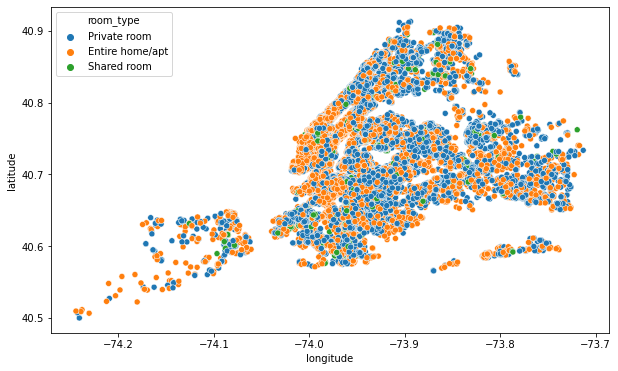

In [59]:
plt.figure(figsize=(10,6))
sns.scatterplot(df.longitude,df.latitude,hue=df.room_type)

### Latitude and Longitude with room availablity for 365 days

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='longitude', ylabel='latitude'>

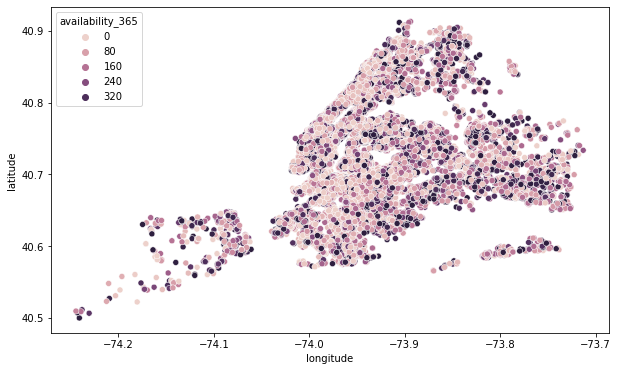

In [60]:
plt.figure(figsize=(10,6))
sns.scatterplot(df_copy.longitude,df_copy.latitude,hue=df_copy.availability_365)

# Conclusion:
### So far we have done some basic exploring of the dataset and have gain few insights from it such as:

Came to know that the price column had some irregularities such as the minimum price was 0$ which is not possible.

Missing values in the last_review column and reviews_per_month column were following a pattern. If number_of_reviews was 0 then these two columns had null values.

From the univariate analysis we came to know the top 5 neighbourhood whcih had the highest number of properties listed.

We also came to know the top neighbourhood groups which had the highest number of properties listed.

We came to know the top 5 properties which had the highest review and factors contibuting to their reviews.

We came to know that properties closer to the airport had a good number of reviews.

We saw the host which had the highest number of properties listed on Airbnb.

We saw the distribution of the properties based on the neighbourhood_group on a scatter plot.

##########################################

### Plots

<AxesSubplot:xlabel='room_type', ylabel='count'>

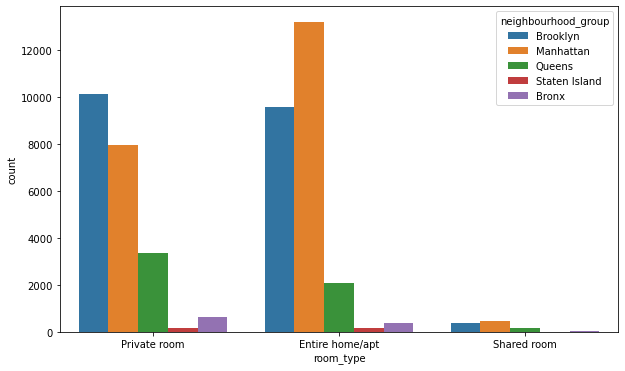

In [61]:
plt.figure(figsize=(10,6))
sns.countplot(data = df, x = 'room_type', hue = 'neighbourhood_group')

### Home service seems to be most used by people and the highest in Manhattan. This is also the highest service used across New York City.

In Brooklyn, Private rooms were more used.

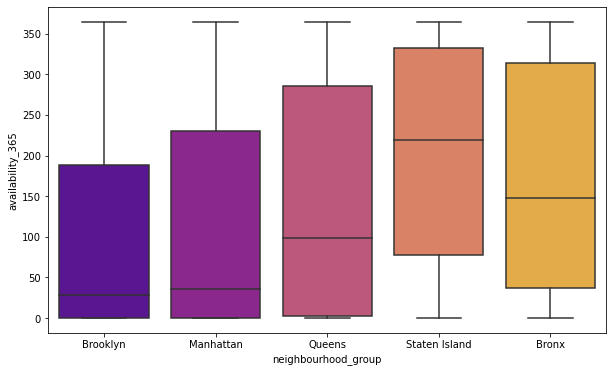

In [62]:
plt.figure(figsize=(10,6))
ax = sns.boxplot(data=df_copy, x='neighbourhood_group',y='availability_365',palette='plasma')

Staten Island has th highest average airbnb availablity.

Text(0.5, 1.0, 'Density and distribution of prices for each neighberhood_group')

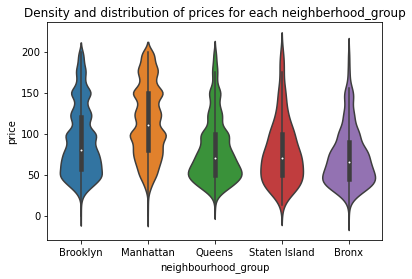

In [63]:
v2=sns.violinplot(data=df[df.price < 200], x='neighbourhood_group', y='price')
v2.set_title('Density and distribution of prices for each neighberhood_group')

Manhattan airbnb's has the highest average price.

In [64]:
df['neighbourhood'].value_counts().iloc[:10]

Williamsburg          3920
Bedford-Stuyvesant    3714
Harlem                2658
Bushwick              2465
Upper West Side       1971
Hell's Kitchen        1958
East Village          1853
Upper East Side       1798
Crown Heights         1564
Midtown               1545
Name: neighbourhood, dtype: int64

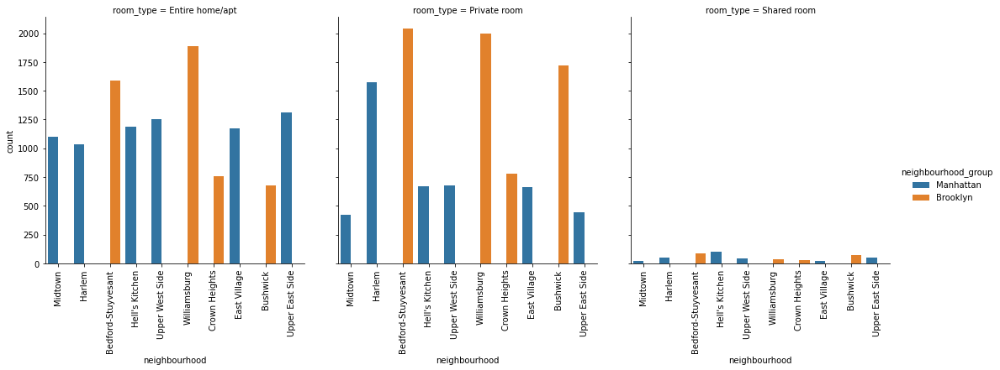

In [65]:
neighb =df.loc[df['neighbourhood'].isin(['Williamsburg','Bedford-Stuyvesant','Harlem','Bushwick','Upper West Side','Hell\'s Kitchen','East Village','Upper East Side','Crown Heights','Midtown'])]
pl =sns.catplot(x='neighbourhood', hue='neighbourhood_group', col='room_type', data=neighb, kind='count')
pl.set_xticklabels(rotation=90)

<AxesSubplot:>

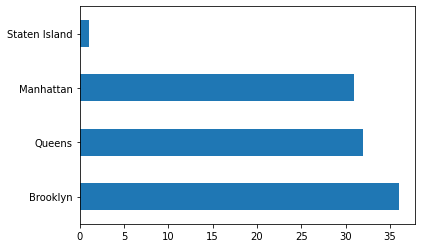

In [66]:
# Rooms with top 100 reviews by neighbourhood
dfr=df.sort_values(by=['number_of_reviews'],ascending=False).head(100)
dfr['neighbourhood_group'].value_counts().plot(kind = 'barh')

If we look at the top 100 airbnb's with number of reviews, Brooklyn has highest reviews followed by Queens and then Manhattan.

<AxesSubplot:>

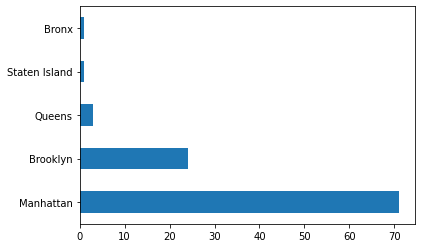

In [67]:
# Rooms with top 100 expensive by neighbourhood
dfr=df.sort_values(by=['price'],ascending=False).head(100)
dfr['neighbourhood_group'].value_counts().plot(kind = 'barh')

If we take the top 100 airbnbs then almost 70+ comes in Manhattan, followed by 25 in Brooklyn.

<AxesSubplot:>

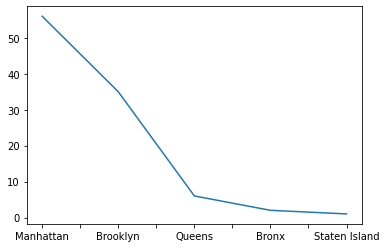

In [68]:
# Rooms with top 100 minimum_nights  by neighbourhood
dfr=df.sort_values(by=['minimum_nights'],ascending=False).head(100)
dfr['neighbourhood_group'].value_counts().plot()

Manhattan has highest airbnbs with highest minimum nights.

Text(0.5, 1.0, 'Room Type vs Price vs Neighbourhood Group')

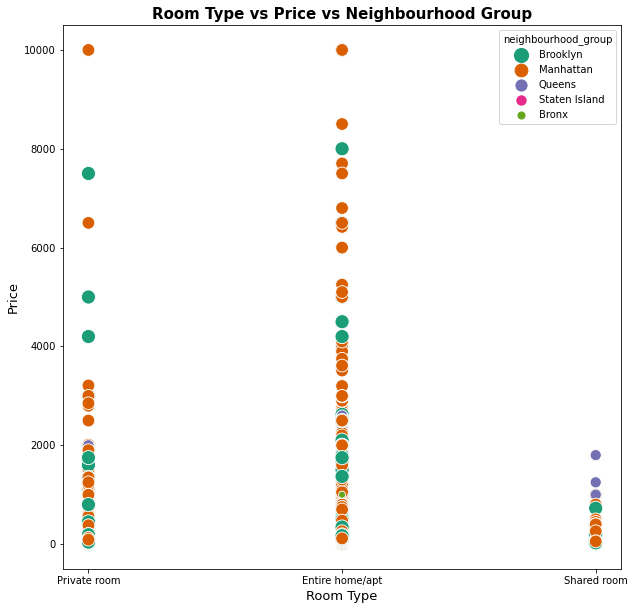

In [69]:
plt.figure(figsize=(10,10))
sns.scatterplot(x="room_type", y="price",
            hue="neighbourhood_group", size="neighbourhood_group",
            sizes=(50, 200), palette="Dark2", data=df)

plt.xlabel("Room Type", size=13)
plt.ylabel("Price", size=13)
plt.title("Room Type vs Price vs Neighbourhood Group",size=15, weight='bold')

## Data Cleaning

### We dont require host_id,name,id,host_name and last_review as these do not any way effect for further analysis or pre-processing. So we can drop them.

In [70]:
## We can remove the unwanted columns. Here id,name , host_name and last_review doesnt help us in anyway in our approch for data analysis.
df.drop(['host_id','name','latitude','longitude','id','host_name','last_review'], axis=1, inplace=True)
df.head()

,neighbourhood_group,neighbourhood,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,Brooklyn,Kensington,Private room,149,1,9,0.21,6,365
1,Manhattan,Midtown,Entire home/apt,225,1,45,0.38,2,355
2,Manhattan,Harlem,Private room,150,3,0,0.00,1,365
3,Brooklyn,Clinton Hill,Entire home/apt,89,1,270,4.64,1,194
4,Manhattan,East Harlem,Entire home/apt,80,10,9,0.10,1,0


Since we removed 4 columns from the dataframe, we now have to deal with 12 columns.

In [71]:
df.isna().sum()

neighbourhood_group               0
neighbourhood                     0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
dtype: int64

In [72]:
df['reviews_per_month'].describe()

count    48895.000000
mean         1.090910
std          1.597283
min          0.000000
25%          0.040000
50%          0.370000
75%          1.580000
max         58.500000
Name: reviews_per_month, dtype: float64

We can actually fill all the rows of column of reviews_per_month as 0 where its null value, this is because the data is null only because no one has reviewd it and hence the number of review is 0 here.

In [73]:
df['reviews_per_month'] = df['reviews_per_month'].fillna(0)
# Missing value implies there are no reviews for the location.

In [74]:
df.isna().sum()

neighbourhood_group               0
neighbourhood                     0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
dtype: int64

In the availablity_365 , if we have 365 days availablity then we can directly assgn them as 365 itself and 0 for rest because they isnt availavle for 365 days.

## Hypothesis Testing

Here we have taken a dataset where we have room types as homes and non-homes and their total availablity.

In [75]:
df_copy.loc[df_copy['room_type'] == 'Entire home/apt', 'home'] = True
df_copy.loc[df_copy['room_type'] != 'Entire home/apt', 'home'] = False

In [76]:
df_hyp = df_copy[['home','availability_365']]
df_hyp.head()

,home,availability_365
0,False,365
1,True,355
2,False,365
3,True,194
4,True,0


In [77]:
df_hyp.groupby('home').count()

,availability_365
home,
False,23486
True,25409


We can find that almost 23k airbnb's are non-homes that is a private room or shared room while 25k of them are homes

In [78]:
home = df_hyp['availability_365'][df_hyp['home']==True]
non_home = df_hyp['availability_365'][df_hyp['home']==False]

array([<AxesSubplot:title={'center':'False'}>,
       <AxesSubplot:title={'center':'True'}>], dtype=object)

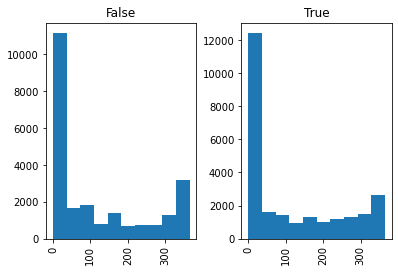

In [79]:
import matplotlib.pyplot as plt
%matplotlib inline
df_hyp.hist(by ='home')

Following is the hist representation of both homes and non-homes.

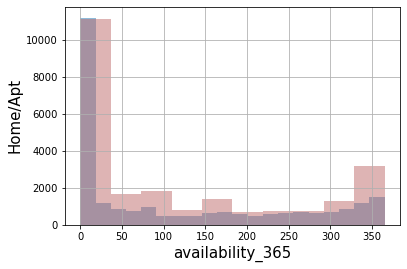

In [80]:
import seaborn as sns
home.hist(histtype='stepfilled', alpha=.5, bins=20)     # default number of bins = 10
non_home.hist(histtype='stepfilled', alpha=.5,color=sns.desaturate("indianred", 0.75 ), bins=10)
plt.xlabel('availability_365',fontsize=15)
plt.ylabel('Home/Apt',fontsize=15)
plt.show()

On an average the non-homes were more as compared to that of homes data.

Hypothesis:
Null hypothsis : Availablity has no influence over airbnb being home or non-home.

Alternate : Availablity has an influence over airbnb being home or non-home.

#### Test Statics

Using the mean availablity difference of homes and non-homes.

In [81]:
means_table =df_hyp.groupby('home').mean()
means_table

,availability_365
home,
False,113.712850
True,111.920304


On an average non homes availablity is more in a year than homes.

In [82]:
observatied_diff = means_table['availability_365'][1] - means_table['availability_365'][0]
observatied_diff

-1.7925463792831238

## Predicting the Statistic under null hypothesis

##### Simulating the null hypothesis under permuation

In [83]:
shuffled = df_hyp.sample(len(df_hyp),replace = False)
shuffled

,home,availability_365
26467,True,0
24116,False,328
42266,True,341
2447,False,0
8279,True,0
...,...,...
42454,False,304
6747,False,80
27955,False,0
48583,True,179


In [84]:
shuffled_availablity = shuffled['availability_365']
type(shuffled_availablity)

pandas.core.series.Series

In [85]:
orig_and_shuff = df_hyp.assign(shuffled_availablity = shuffled_availablity.values)
orig_and_shuff

,home,availability_365,shuffled_availablity
0,False,365,0
1,True,355,328
2,False,365,341
3,True,194,0
4,True,0,0
...,...,...,...
48890,False,9,304
48891,False,36,80
48892,True,27,0
48893,False,2,179


In [86]:
all_group_means = orig_and_shuff.groupby('home').mean()
all_group_means

,availability_365,shuffled_availablity
home,,
False,113.712850,112.474325
True,111.920304,113.065095


In [87]:
difference = all_group_means['shuffled_availablity'][0]- all_group_means['shuffled_availablity'][1]
difference

-0.5907699151981802

In [88]:
observatied_diff

-1.7925463792831238

## One simulation

In [89]:
shuffled = df_hyp.sample(len(df_hyp),replace = False)
shuffled_availablity = shuffled['availability_365']
orig_and_shuff = df_hyp.assign(shuffled_availablity = shuffled_availablity.values)
all_group_means = orig_and_shuff.groupby('home').mean()
differences = abs(all_group_means['shuffled_availablity'][0] - all_group_means['shuffled_availablity'][1])

In [90]:
differences

0.7092058936659811

## Permutation test

### Simulating for many times and collecting the differences in an array

In [91]:
differences = np.zeros(5000)

In [92]:
for i in range(5000):
    shuffled = df_hyp.sample(len(df_hyp),replace = False)
    shuffled_availablity = shuffled['availability_365']
    orig_and_shuffled = df_hyp.assign(shuffled_availablity = shuffled_availablity.values)
    all_group_means = orig_and_shuffled.groupby('home').mean()
    difference = (all_group_means['shuffled_availablity'][0] - all_group_means['shuffled_availablity'][1])
    differences[i] = difference

In [93]:
differnces_df = pd.DataFrame(differences)
differnces_df

,0
0,1.178446
1,0.523050
2,1.172547
3,-0.674753
4,0.872584
...,...
4995,-1.022484
4996,-0.168151
4997,0.824734
4998,1.088973


In [94]:
import matplotlib
%matplotlib inline
plt.style.use('fivethirtyeight')

-1.7925463792831238


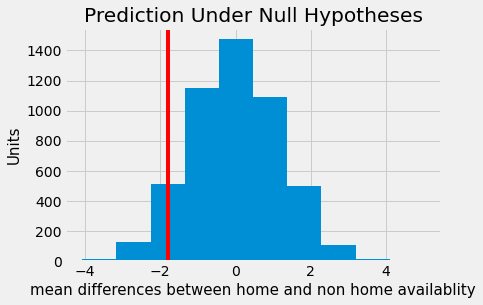

In [95]:
differnces_df.hist()
plt.title('Prediction Under Null Hypotheses');
plt.xlabel('mean differences between home and non home availablity',fontsize=15)
plt.ylabel('Units',fontsize=15);
plt.axvline(observatied_diff, color='red');
print(observatied_diff)

In [96]:
np.count_nonzero(differences <= observatied_diff)/differences.size

0.068

The empirical P-value is nearly 0, meaning that none of the 5,000 observed samples resulted in a difference of -1.79 or lower. This is an approximation; the exact chance of getting a difference in that range is not 0 but it is vanishingly small.

Therefore, we reject the null hypothesis and go for alternate hypothesis. Therefore, Availablity do have an influence on airbnb being home or non-home.

In [97]:
### T-Test (Students T-Test)


Here, i performed t-test to check wheather the availablity of airbnb when taken a sample would change majorly with that of the overall average avaialblity of all airbnbs for airbnb's which are available for atleast more than a month.

Null hypothsis : Average availablity of Airbnbs would be same even if we take a sample of availablity data.

Alternate : Average availablity of Airbnbs would be different if we take a sample of availablity data.

In [98]:
%matplotlib inline
warnings.filterwarnings("ignore")
rcParams['figure.figsize'] = 8,8
rcParams['font.size'] = 30
sns.set()
np.random.seed(8)

In [99]:
def plot_distribution(inp):
    plt.figure()
    ax = sns.distplot(inp)
    ax.set_xlim([30, 365])
    plt.axvline(np.mean(inp), color="k", linestyle="dashed", linewidth=3)
    _, max_ = plt.ylim()
    plt.text(
        inp.mean() + inp.mean() / 10,
        max_ - max_ / 10,
        "Mean: {:.2f}".format(inp.mean()),
    )
    return plt.figure

A function to carry out plotting for distributions.

In [100]:
df_copy.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365', 'home'],
      dtype='object')

We are intrested to get the data of airbnb's available over a month.

In [101]:
df_hyp = df_copy[['neighbourhood_group','availability_365']]
df_hyp = df_hyp[df_hyp['availability_365'] > 30]
df_hyp.head()

,neighbourhood_group,availability_365
0,Brooklyn,365
1,Manhattan,355
2,Manhattan,365
3,Brooklyn,194
5,Manhattan,129


## We can visualize the distribution with its mean value for entire dataframe.

<function matplotlib.pyplot.figure(num=None, figsize=None, dpi=None, facecolor=None, edgecolor=None, frameon=True, FigureClass=<class 'matplotlib.figure.Figure'>, clear=False, **kwargs)>

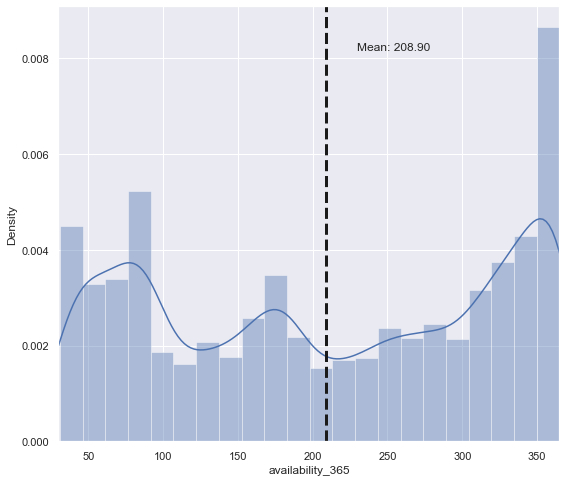

In [102]:
plot_distribution(df_hyp['availability_365'])

I have taken a large sample of data as my data is not normal taking small sample size for t-test would be invalid.

In [103]:
sample_size = 2000
avail_sample=np.random.choice(df_hyp['availability_365'],sample_size)
avail_sample

array([342, 127,  85, ...,  91,  39, 297], dtype=int64)

In [104]:
np.mean(avail_sample)

210.0335

We can visualize the distribution with its mean value for sample dataframe.

<function matplotlib.pyplot.figure(num=None, figsize=None, dpi=None, facecolor=None, edgecolor=None, frameon=True, FigureClass=<class 'matplotlib.figure.Figure'>, clear=False, **kwargs)>

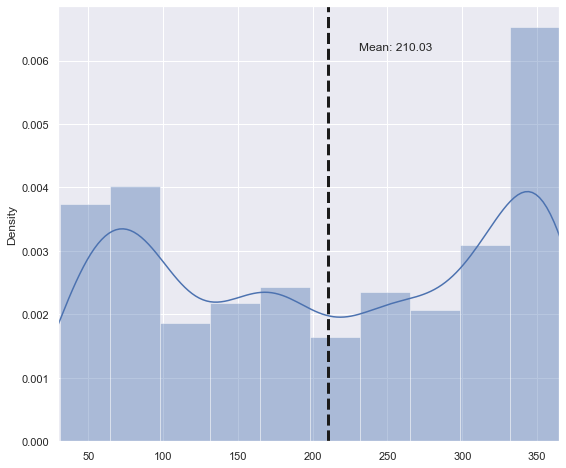

In [105]:
plot_distribution(avail_sample)

Now we can take both homes and non-homes and plot and overlay to get the mean of each on graph.

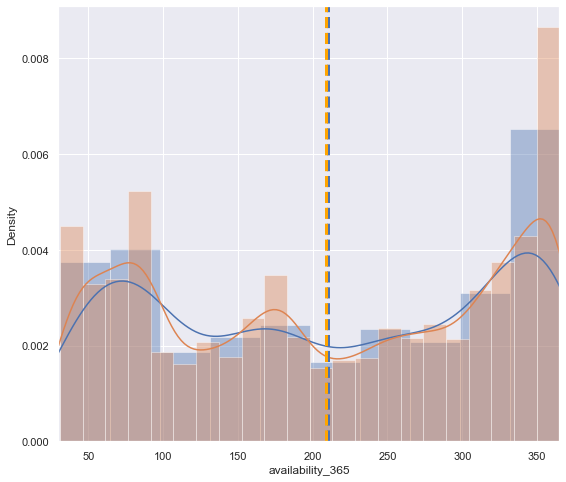

In [106]:
plt.figure()
ax1 = sns.distplot(avail_sample)
ax2 = sns.distplot(df_hyp['availability_365'])
ax1.set_xlim([30, 365])
ax2.set_xlim([30, 365])
plt.axvline(np.mean(avail_sample), color='b', linestyle='dashed', linewidth=3)
plt.axvline(np.mean(df_hyp['availability_365']), color='orange', linestyle='dashed', linewidth=3)

In [107]:
### I have use Scipy library to import ttest_ind which helps us to carry out the t-test and give us the p-value.

In [108]:
def compare_2_groups(arr_1, arr_2, alpha):
    stat, p = ttest_ind(arr_1, arr_2)
    print('Statistics=%.3f, p=%.3f' % (stat, p))
    if p > alpha:
        print('Same distributions hence we fail to reject H0(Null Hypothesis)')
    else:
        print('Different distributions hence we reject H0(Null Hypothesis)')

compare_2_groups(df_hyp['availability_365'], avail_sample, 0.05)

Statistics=-0.436, p=0.663
Same distributions hence we fail to reject H0(Null Hypothesis)


Statistics=-0.436, p=0.663
Same distributions hence we fail to reject H0(Null Hypothesis)
Here we fail to reject H0 and hence we accept the null hypothesis itself that the average availablity of Airbnbs would be same even if we take a sample of availablity data.

## Encoding Data and Outlier removal

We can first see the box plot of the price and find some outliers and remove them so that we can do better in further steps.

In [109]:
df = pd.read_csv('https://raw.githubusercontent.com/Siddharth1698/New-York-City-Airbnb-Data-Case-Study/main/AB_NYC_2019.csv')

fig = px.box(df, y="price")
fig.update_layout(
    autosize=False,
    width=500,
    height=400
)
fig.show()

Here, we can see that there are a lot of outliers taking up the data, it could be expensive Airbnbs, but there are a very few of them compared to data and it overall has a huge impact and must be removed.

<AxesSubplot:>

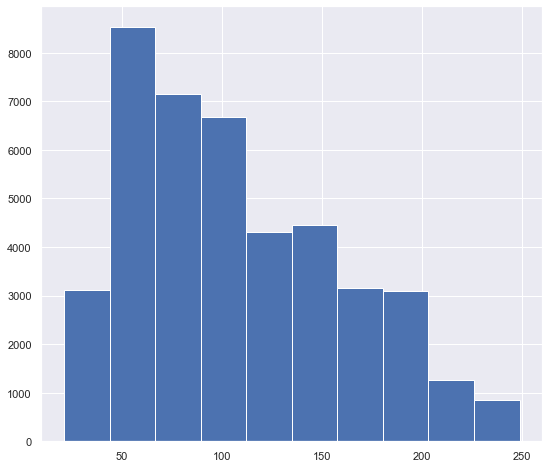

In [110]:
dfp = df["price"][df["price"] < 250]
dfp[dfp > 20].hist()

After experimenting around values the range of (20,250) has a good gaussian wise distribution and hence we can go ahead with data in this range and remove others as outliers.

In [111]:
df=df[df["price"]<250]
df=df[df["price"]>20]
df['room_type'].value_counts()

Private room       21722
Entire home/apt    19770
Shared room         1090
Name: room_type, dtype: int64

In [112]:
fig = px.box(df, y="price")
fig

This is the final price data on which we are performing the rest of operations.

In [113]:
df.fillna({'reviews_per_month':0}, inplace=True)
df.drop(['id','host_id','latitude','longitude','host_name','last_review','name'], axis = 1,inplace=True)
df = pd.get_dummies(df, columns=['neighbourhood_group',"room_type"], prefix = ['ng',"rt"],drop_first=True)
df.drop(["neighbourhood"], axis=1, inplace=True)
df.head()

,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,ng_Brooklyn,ng_Manhattan,ng_Queens,ng_Staten Island,rt_Private room,rt_Shared room
0,149,1,9,0.21,6,365,1,0,0,0,1,0
1,225,1,45,0.38,2,355,0,1,0,0,0,0
2,150,3,0,0.00,1,365,0,1,0,0,1,0
3,89,1,270,4.64,1,194,1,0,0,0,0,0
4,80,10,9,0.10,1,0,0,1,0,0,0,0


### We performed an Encoding on neighbourhood and room type and removed some unwanted columns.

## Linear Regression

In [114]:
def linear(x,z):
    global X,y,predictions,residue
    X = df_reg[x].values.reshape(-1,1)
    y = df_reg[z].values.reshape(-1,1)
  

  #3 Feature Scaling
    from sklearn.preprocessing import StandardScaler
    sc_X = StandardScaler()
    sc_y = StandardScaler()

    X = sc_X.fit_transform(X)
    y = sc_X.fit_transform(y)

    from sklearn.linear_model import LinearRegression
    reg = LinearRegression()
    reg.fit(X, y)

    print("The linear model is: Y = {:.2} + {:.2}X".format(reg.intercept_[0], reg.coef_[0][0]))

    print("Regression Intercept : ",reg.intercept_[0])


    predictions = reg.predict(X)
    rms = mean_squared_error(y, predictions, squared=False)

    fig = px.scatter(
    df_reg, x=x, y=z, opacity=0.65,
    trendline='ols', trendline_color_override='darkblue')
    fig.show()

 # Plot the residuals after fitting a linear model
    sns.residplot(x=X, y=y, lowess=True, color="g")

    print("RMSE is: ", rms)
    x2 = sm.add_constant(X)

    est = sm.OLS(y, x2)
  #OLS is Ordinary Least Squares

  #est.TAB
    est2 = est.fit()
    print(est2.summary())

    residue = y - predictions

I defined a function here that will help us automatically do the regression and show the plot and OLS results.

Here i got intrested to know how the regresion line performs as early during wrangling i found number of reviews and reviews per month to be correlated with an coeffecient of 0.5. I have specfically taken a range of data for my regression purpose for better visualization. That is num of reviews less than 400 and reviews per month less than 15.

In [115]:
df_reg = df[['number_of_reviews','reviews_per_month']]
df_reg = df_reg[df_reg['number_of_reviews']<400]
df_reg = df_reg[df_reg['reviews_per_month']<15]
df_reg

,number_of_reviews,reviews_per_month
0,9,0.21
1,45,0.38
2,0,0.00
3,270,4.64
4,9,0.10
...,...,...
48890,0,0.00
48891,0,0.00
48892,0,0.00
48893,0,0.00


Here we are plotting thr linear model for this simple linear regression. We can analyze the model and get the regression Intercept.

Also i have plotted the residue plot at the end so that we can see how the difference between actual value and prediction is.

The linear model is: Y = 1.1e-16 + 0.6X
Regression Intercept :  1.148724933926078e-16


RMSE is:  0.8007634689812883
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.359
Model:                            OLS   Adj. R-squared:                  0.359
Method:                 Least Squares   F-statistic:                 2.380e+04
Date:                Mon, 23 May 2022   Prob (F-statistic):               0.00
Time:                        00:33:36   Log-Likelihood:                -50905.
No. Observations:               42536   AIC:                         1.018e+05
Df Residuals:                   42534   BIC:                         1.018e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       4.163e-16  

,number_of_reviews,reviews_per_month,Predictions,Residue
0,9.0,0.21,-0.204685,-0.370260
1,45.0,0.38,0.285444,-0.751599
2,0.0,0.00,-0.327217,-0.382115
3,270.0,4.64,3.348749,-1.088766
4,9.0,0.10,-0.204685,-0.440653


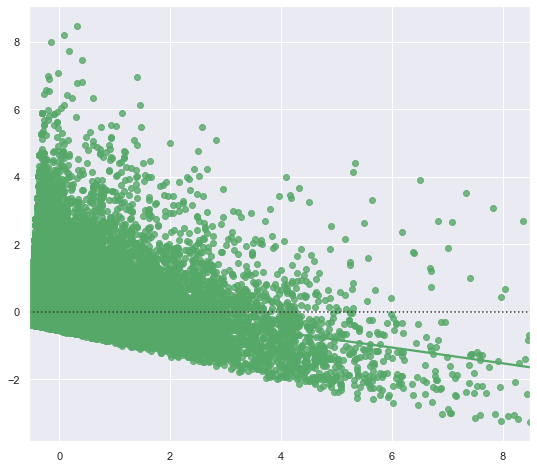

In [116]:
linear('number_of_reviews','reviews_per_month')
df_n = pd.DataFrame(predictions, columns = ['Predictions'])
df_reg_new = pd.concat([df_reg,df_n],axis = 1)
df_n = pd.DataFrame(residue, columns = ['Residue'])
df_reg_new = pd.concat([df_reg_new,df_n],axis = 1)
df_reg_new[['number_of_reviews','reviews_per_month','Predictions','Residue']].head()

Here we are plotting thr linear model for this simple linear regression. We can analyze the model and get the regression Intercept.

Also i have plotted the residue plot at the end so that we can see how the difference between actual value and prediction is.

The linear model is: Y = 1.1e-16 + 0.6X
Regression Intercept :  1.148724933926078e-16


RMSE is:  0.8007634689812883
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.359
Model:                            OLS   Adj. R-squared:                  0.359
Method:                 Least Squares   F-statistic:                 2.380e+04
Date:                Mon, 23 May 2022   Prob (F-statistic):               0.00
Time:                        00:33:43   Log-Likelihood:                -50905.
No. Observations:               42536   AIC:                         1.018e+05
Df Residuals:                   42534   BIC:                         1.018e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       4.163e-16  

,number_of_reviews,reviews_per_month,Predictions,Residue
0,9.0,0.21,-0.204685,-0.370260
1,45.0,0.38,0.285444,-0.751599
2,0.0,0.00,-0.327217,-0.382115
3,270.0,4.64,3.348749,-1.088766
4,9.0,0.10,-0.204685,-0.440653


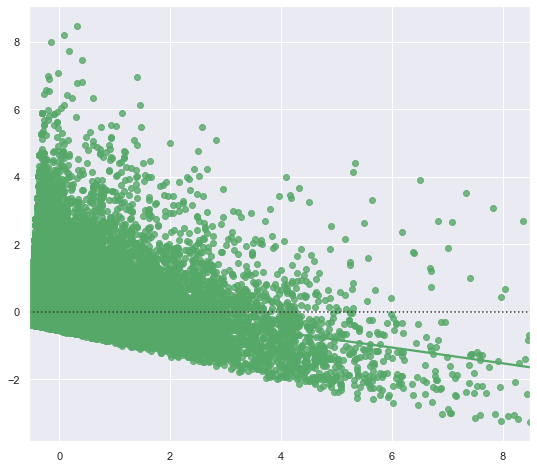

In [117]:
linear('number_of_reviews','reviews_per_month')
df_n = pd.DataFrame(predictions, columns = ['Predictions'])
df_reg_new = pd.concat([df_reg,df_n],axis = 1)
df_n = pd.DataFrame(residue, columns = ['Residue'])
df_reg_new = pd.concat([df_reg_new,df_n],axis = 1)
df_reg_new[['number_of_reviews','reviews_per_month','Predictions','Residue']].head()

We can from here interpret the fact that R2 is almost 0.35 which means the model is considered weak in nature and not particularly weak. We have also got our RMSE around 0.8 which is fine to an extent.

## Multiple Linear Regression
Here we are intrested to predict the prices of Airbnb's with help of all other variables assosiated with it.

In [118]:
df.head()

,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,ng_Brooklyn,ng_Manhattan,ng_Queens,ng_Staten Island,rt_Private room,rt_Shared room
0,149,1,9,0.21,6,365,1,0,0,0,1,0
1,225,1,45,0.38,2,355,0,1,0,0,0,0
2,150,3,0,0.00,1,365,0,1,0,0,1,0
3,89,1,270,4.64,1,194,1,0,0,0,0,0
4,80,10,9,0.10,1,0,0,1,0,0,0,0


In [119]:
df.shape

(42582, 12)

I am taking the price as 'y' and the rest of columns as 'X'. Here we can see that the data are all of different scales and hence we use the help of StandardScaler to scale them and we can procced with out splitting.

In [120]:
X = df.drop(['price'],axis=1)
y = df['price'].values.reshape(-1,1)


sc_X = StandardScaler()
sc_y = StandardScaler()

X = sc_X.fit_transform(X)
y = sc_X.fit_transform(y)

I used 30% of the data for testing and fitting it to the linear model which we generated using the rest off the data.

In [121]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

In [122]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(29807, 11)
(29807, 1)
(12775, 11)
(12775, 1)


This is our linear model and we can see the intercept and coefficents at the end.

In [123]:
# instantiate
linreg = LinearRegression()

# fit the model to the training data (learn the coefficients)
linreg.fit(X_train, y_train)

# print the intercept and coefficients
print("intercept is: ",linreg.intercept_)

print("coefficients are: ",linreg.coef_)

intercept is:  [-0.00065527]
coefficients are:  [[-0.06012777 -0.00322637 -0.02921139  0.05312798  0.09180824  0.15880011
   0.37331764  0.04477949 -0.00667876 -0.60179669 -0.25548752]]


In [124]:
y_pred = linreg.predict(X_test)

In [125]:
print("R-Square Value",r2_score(y_test,y_pred))
print("\n")
print ("mean_absolute_error :",metrics.mean_absolute_error(y_test, y_pred))
print("\n")
print ("mean_squared_error : ",metrics.mean_squared_error(y_test, y_pred))
print("\n")
print ("root_mean_squared_error : ",np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

R-Square Value 0.49825062463278325


mean_absolute_error : 0.5447704306017557


mean_squared_error :  0.4979601463281744


root_mean_squared_error :  0.7056629126772743


We can from here interpret the fact that R2 is almost 0.5 which means the model is moderate in nature and not particularly weak. We have also got our RMSE around 0.7 which is fine.

Next, we go for a 10 fold cross validation on our Linear model.

In [126]:
my_pipeline = Pipeline(steps=[('model', LinearRegression())])

from sklearn.model_selection import cross_val_score

# Multiply by -1 since sklearn calculates *negative* scores
scores1 =  1 * cross_val_score(my_pipeline, X, y,
                              cv=10,
                              scoring='r2')
scores2 = -1 * cross_val_score(my_pipeline, X, y,
                              cv=10,
                              scoring='neg_mean_absolute_error')
scores3 = -1 * cross_val_score(my_pipeline, X, y,
                              cv=10,
                              scoring='neg_root_mean_squared_error')

print("R squared scores:\n", scores1)
print("Average R squared score (across experiments):",scores1.mean())


print("RMSE scores:\n", scores3)
print("Average RMSE score (across experiments):",scores3.mean())

R squared scores:
 [0.40285593 0.43615142 0.4762851  0.51862289 0.46868858 0.4777346
 0.4933936  0.47629253 0.54692744 0.53290862]
Average R squared score (across experiments): 0.4829860705352533
RMSE scores:
 [0.75009141 0.7151905  0.71130755 0.69458738 0.70942643 0.69992466
 0.69973819 0.71329621 0.72334227 0.72276634]
Average RMSE score (across experiments): 0.7139670947693814


Average RMSE score (across experiments): 0.7139670947693814
We can see that the average R square came around 0.48 and RMSE around 0.71.

In [127]:
x2 = sm.add_constant(X)
est = sm.OLS(y, x2)
#OLS is Ordinary Least Squares
#est.TAB
est2 = est.fit()
print(est2.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.494
Model:                            OLS   Adj. R-squared:                  0.494
Method:                 Least Squares   F-statistic:                     3777.
Date:                Mon, 23 May 2022   Prob (F-statistic):               0.00
Time:                        00:33:45   Log-Likelihood:                -45920.
No. Observations:               42582   AIC:                         9.186e+04
Df Residuals:                   42570   BIC:                         9.197e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       6.943e-16      0.003   2.01e-13      1.0

## Classification

In [128]:
df_classif = df

In [129]:

df_classif['availability_365'] = df_classif['availability_365'].apply(lambda x: 1 if x == 365 else 0)


<AxesSubplot:xlabel='availability_365', ylabel='count'>

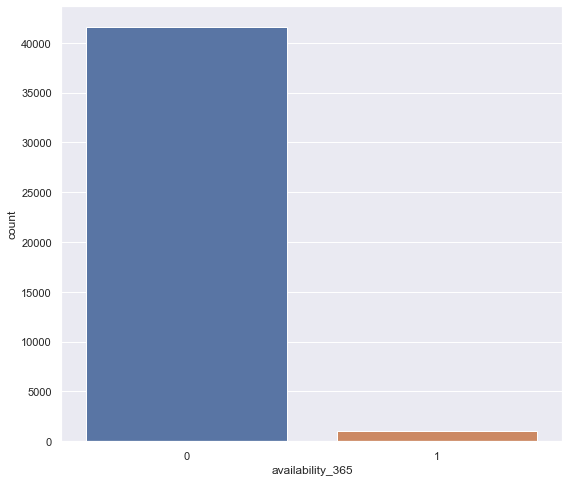

In [130]:
sns.countplot(df_classif['availability_365'])

In [131]:
X = df_classif.drop(['availability_365'],axis=1)
y = df_classif['availability_365'].values

Went for oversampling as we can see a huge imbalance in data, so we would end up with very low AUC score. Oversampling seem to work better than undersampling in this case.

In [132]:
from imblearn.over_sampling import SMOTE
import imblearn
oversample = SMOTE()
X, y = oversample.fit_resample(X, y)

<AxesSubplot:ylabel='count'>

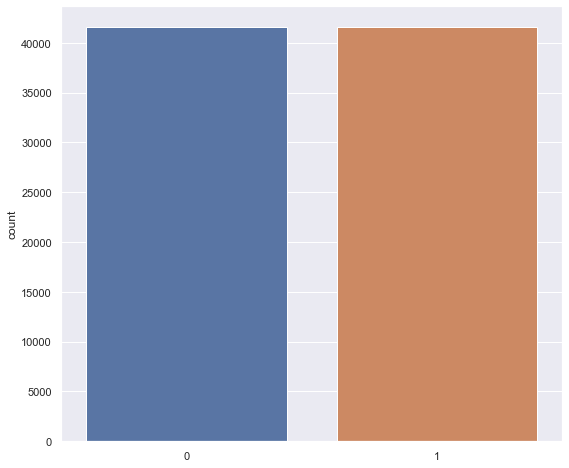

In [133]:
sns.countplot(y)

In [134]:
len(y)

83156

Defining a functiom to perform classification plotting of confusion matrix.

In [135]:
def plot_roc_curve(fpr, tpr):
    plt.plot(fpr, tpr, color='orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()
    
# Used for classification of dataset.
def classif_results(): 
    conf_mat = confusion_matrix(y_true=y_test, y_pred=y_pred)
    print('Confusion matrix:\n', conf_mat)

    labels = ['Class 0', 'Class 1']
    fig = plt.figure()
    ax = fig.add_subplot(111)
    cax = ax.matshow(conf_mat, cmap=plt.cm.Blues)
    fig.colorbar(cax)
    ax.set_xticklabels([''] + labels)
    ax.set_yticklabels([''] + labels)
    plt.xlabel('Predicted')
    plt.ylabel('Expected')
    plt.show()
    
    
    print("Accuracy", metrics.accuracy_score(y_test, y_pred))

    from sklearn.metrics import classification_report
    print(classification_report(y_test, y_pred))

  
    auc = roc_auc_score(y_test, y_pred)
    print("AUC Score: ")
    print(auc)

    fpr, tpr, thresholds = roc_curve(y_test, y_pred)
    plot_roc_curve(fpr, tpr)